<a id = "1"></a>
<span style="color:#337AB7;
             font-size:200%;">
Libraries and Utilities

In [ ]:
!pip install cufflinks

In [ ]:
!pip install chart_studio

     |████████████████████████████████| 64 kB 529 kB/s eta 0:00:01


In [ ]:
!pip install plotly

In [ ]:
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

import seaborn as sns
import matplotlib.pyplot as plt
sns.set_style("darkgrid")

from collections import Counter

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import label_binarize

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.svm import SVC
from sklearn.svm import LinearSVC

from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import SGDClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import auc
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import f1_score
from sklearn.metrics import roc_curve
from sklearn.multiclass import OneVsRestClassifier

from lightgbm import LGBMClassifier

import warnings
warnings.filterwarnings("ignore")


import chart_studio.plotly as py
import cufflinks as cf

import plotly.express as px
%matplotlib inline

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected = True)
cf.go_offline();

import plotly.graph_objs as go

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/mobile-price-classification/train.csv
/kaggle/input/mobile-price-classification/test.csv


<a id = "2"></a>
<span style="color:#337AB7;
             font-size:200%;">
Load and Check Data

In [ ]:
df = pd.read_csv('/kaggle/input/mobile-price-classification/train.csv')
df.head(10)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
5,1859,0,0.5,1,3,0,22,0.7,164,1,...,1004,1654,1067,17,1,10,1,0,0,1
6,1821,0,1.7,0,4,1,10,0.8,139,8,...,381,1018,3220,13,8,18,1,0,1,3
7,1954,0,0.5,1,0,0,24,0.8,187,4,...,512,1149,700,16,3,5,1,1,1,0
8,1445,1,0.5,0,0,0,53,0.7,174,7,...,386,836,1099,17,1,20,1,0,0,0
9,509,1,0.6,1,2,1,9,0.1,93,5,...,1137,1224,513,19,10,12,1,0,0,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
 df.profile_report()

Summarize dataset:   0%|          | 0/35 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<a id = "3"></a>
<span style="color:#337AB7;
             font-size:200%;">
Descriptive Statistics

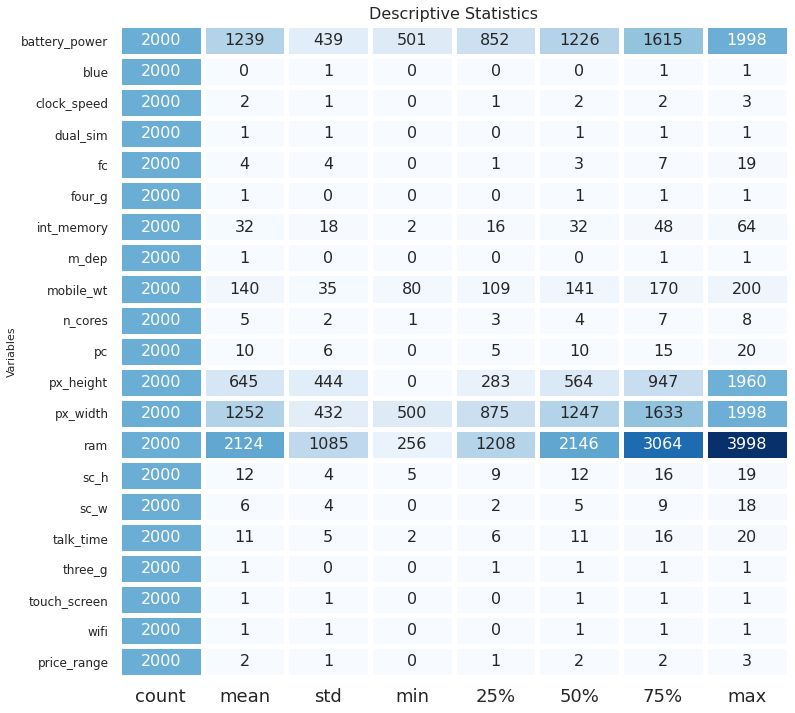

In [ ]:
desc = df.describe().T
df1 = pd.DataFrame(index=['battery_power', 'blue', 'clock_speed', 'dual_sim',
                          'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt',
                          'n_cores', 'pc', 'px_height', 'px_width', 'ram',
                          'sc_h', 'sc_w', 'talk_time', 'three_g','touch_screen',
                          'wifi', 'price_range'],
                   columns= ["count","mean","std","min",
                             "25%","50%","75%","max"], data= desc )

f,ax = plt.subplots(figsize=(12,12))

sns.heatmap(df1, annot=True,cmap = "Blues", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,
            annot_kws={"size": 16})

plt.xticks(size = 18)
plt.yticks(size = 12, rotation = 0)
plt.ylabel("Variables")
plt.title("Descriptive Statistics", size = 16)
plt.show()

<a id = "4"></a>
<span style="color:#337AB7;
             font-size:200%;">
Data Analysis
    
<a id = "5"></a>
<span style="color:#337AB7;
             font-size:180%;">
Ram - Battery Power - Price Range

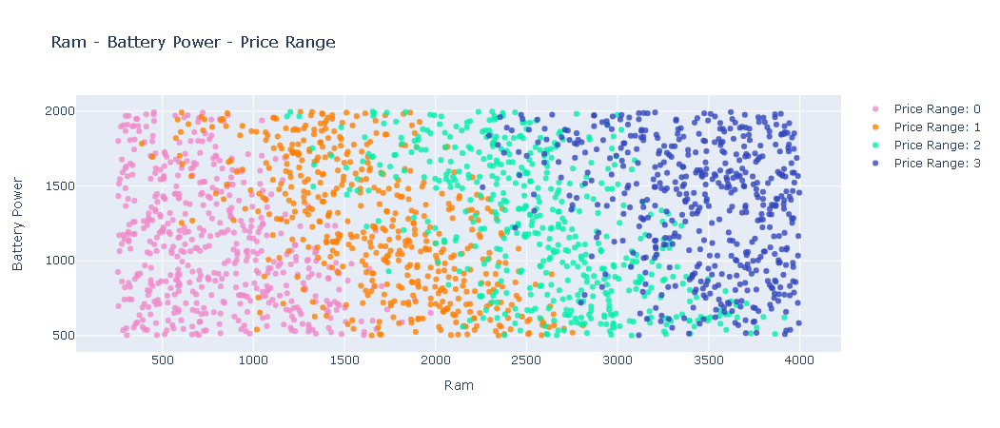

In [ ]:
df_pr_0 = df[df.price_range == 0]
df_pr_1 = df[df.price_range == 1]
df_pr_2 = df[df.price_range == 2]
df_pr_3 = df[df.price_range == 3]

trace1 =go.Scatter(
                    y = df_pr_0.battery_power,
                    x = df_pr_0.ram,
                    mode = "markers",
                    name = "Price Range: 0",
                    marker = dict(color = 'rgba(240, 136, 200, 0.8)'),
                    text= df_pr_0.price_range)

trace2 =go.Scatter(
                    y = df_pr_1.battery_power,
                    x = df_pr_1.ram,
                    mode = "markers",
                    name = "Price Range: 1",
                    marker = dict(color = 'rgba(255, 128, 2, 0.8)'),
                    text= df_pr_1.price_range)

trace3 =go.Scatter(
                    y = df_pr_2.battery_power,
                    x = df_pr_2.ram,
                    mode = "markers",
                    name = "Price Range: 2",
                    marker = dict(color = 'rgba(0, 240, 170, 0.8)'),
                    text= df_pr_2.price_range)

trace4 =go.Scatter(
                    y = df_pr_3.battery_power,
                    x = df_pr_3.ram,
                    mode = "markers",
                    name = "Price Range: 3",
                    marker = dict(color = 'rgba(50, 70, 190, 0.8)'),
                    text= df_pr_3.price_range)


data = [trace1, trace2, trace3, trace4]

layout = dict(title = 'Ram - Battery Power - Price Range',
              xaxis= dict(title= 'Ram',
                          ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Battery Power',
                          ticklen= 5,zeroline= False),
             autosize=False,
             width=700,
             height=450,)
fig = dict(data = data, layout = layout)

iplot(fig)

<a id = "10"></a>
<span style="color:#337AB7;
             font-size:180%;">
3G - 4G

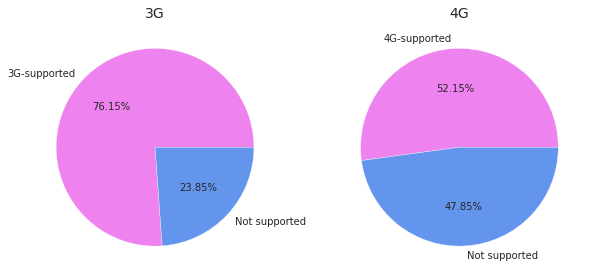

In [ ]:
values_3g = df["three_g"].value_counts()
values_4g = df["four_g"].value_counts()

labels4g = ["4G-supported",'Not supported']
labels3g = ["3G-supported",'Not supported']

colors = ["violet", "cornflowerblue"]

fig = plt.figure(figsize=(10,10))
ax1 = plt.subplot2grid((2,2),(0,0))
plt.pie(x= values_3g, autopct="%.2f%%",
        labels=labels3g, pctdistance=0.6,
        colors = colors)
plt.title('3G', size = 14)

ax1 = plt.subplot2grid((2,2), (0, 1))
plt.pie(x =values_4g,autopct="%.2f%%",
        labels=labels4g, pctdistance=0.6,
        colors = colors)
plt.title('4G', size = 14)
plt.show()

<span style="color:#337AB7;
             font-size:180%;">
Price Range

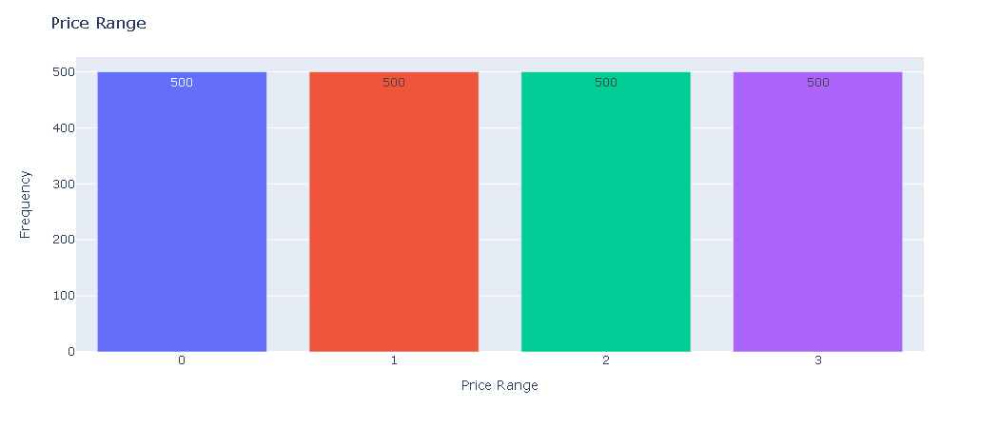

In [ ]:
price_range = df["price_range"].value_counts()

fig = px.bar(price_range, y = 'price_range', text = 'price_range',

                    color = ["Price Range: 0","Price Range: 1",
                            "Price Range: 2","Price Range: 3"])


fig.update_layout(title = "Price Range", showlegend = False,
                 xaxis = dict(zeroline = False, tickmode = 'linear', tick0 = 0, dtick = 1 ),
                 autosize=False,
                 width=700,
                 height=450,
                 xaxis_title_text = 'Price Range',
                 yaxis_title_text = 'Frequency')

fig.show()

<a id = "22"></a>
<span style="color:#337AB7;
             font-size:180%;">
N Cores

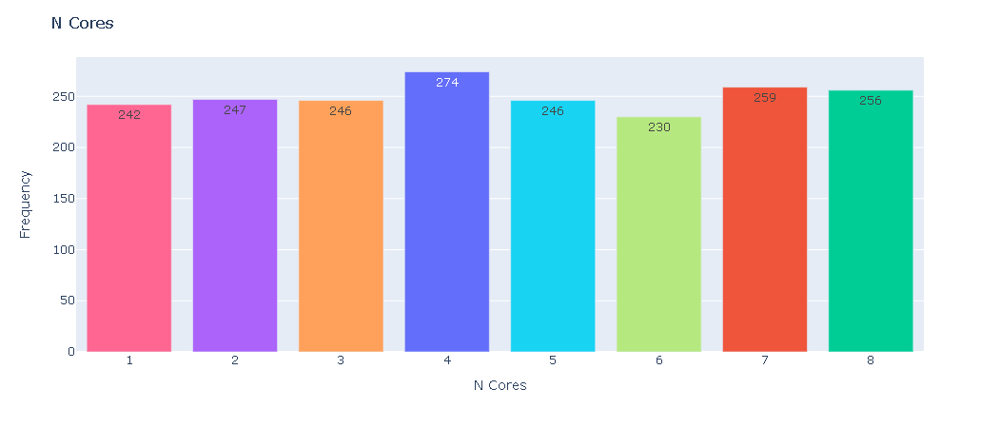

In [ ]:
n_cores = df["n_cores"].value_counts()

fig = px.bar(n_cores, y = 'n_cores', text = 'n_cores',

                    color = ["4","7","8","2","3","5","1","6"])

fig.update_layout(title = "N Cores", showlegend = False,
                 xaxis = dict(zeroline = False, tickmode = 'linear', tick0 = 0, dtick = 1 ),
                 autosize=False,
                 width=700,
                 height=450,
                 xaxis_title_text = 'N Cores',
                 yaxis_title_text = 'Frequency')

fig.show()

<a id = "23"></a>
<span style="color:#337AB7;
             font-size:180%;">
Bluetooth

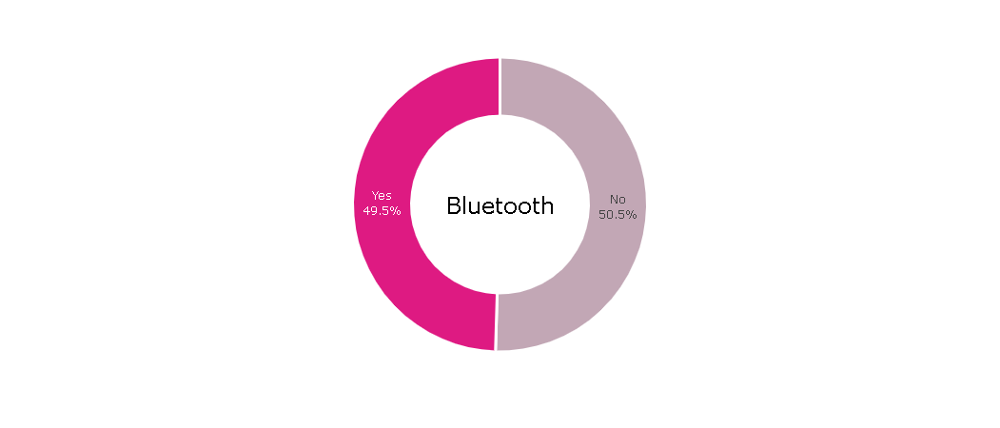

In [ ]:
fig = px.pie(df['blue'].value_counts().reset_index(), values = 'blue',
             names = ['No', 'Yes'])
fig.update_traces(textposition = 'inside',
                  textinfo = 'percent + label',
                  hole = 0.6,
                  marker = dict(colors = ['#C2A7B5','#DE1A82'],
                                line = dict(color = 'white', width = 3)))

fig.update_layout(annotations = [dict(text = 'Bluetooth',
                                      x = 0.5, y = 0.5,
                                      font_size = 24, showarrow = False,
                                      font_family = 'Verdana',
                                      font_color = 'black')],
                  showlegend = False)

fig.show()

<span style="color:#337AB7;
             font-size:180%;">
Dual Sim

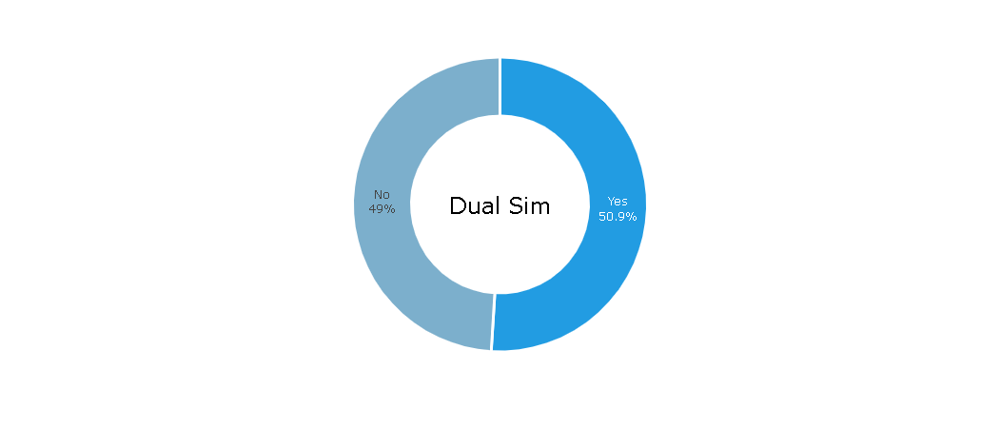

In [ ]:
fig = px.pie(df['dual_sim'].value_counts().reset_index(), values = 'dual_sim',
             names = ['Yes', 'No'])
fig.update_traces(textposition = 'inside',
                  textinfo = 'percent + label',
                  hole = 0.6,
                  marker = dict(colors = ['#229CE2','#7CAFCC'],
                                line = dict(color = 'white', width = 3)))

fig.update_layout(annotations = [dict(text = 'Dual Sim',
                                      x = 0.5, y = 0.5,
                                      font_size = 24, showarrow = False,
                                      font_family = 'Verdana',
                                      font_color = 'black')],
                  showlegend = False)

fig.show()

<span style="color:#337AB7;
             font-size:180%;">
Wifi

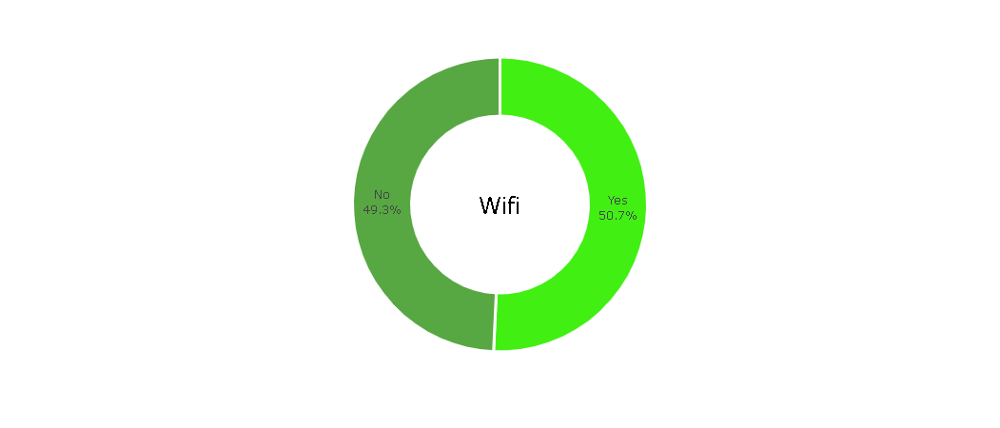

In [ ]:
fig = px.pie(df['wifi'].value_counts().reset_index(), values = 'wifi',
             names = ['Yes', 'No'])
fig.update_traces(textposition = 'inside',
                  textinfo = 'percent + label',
                  hole = 0.6,
                  marker = dict(colors = ['#41EF13','#57A742'],
                                line = dict(color = 'white', width = 3)))

fig.update_layout(annotations = [dict(text = 'Wifi',
                                      x = 0.5, y = 0.5,
                                      font_size = 24, showarrow = False,
                                      font_family = 'Verdana',
                                      font_color = 'black')],
                  showlegend = False)

fig.show()

<span style="color:#337AB7;
             font-size:180%;">
Ram

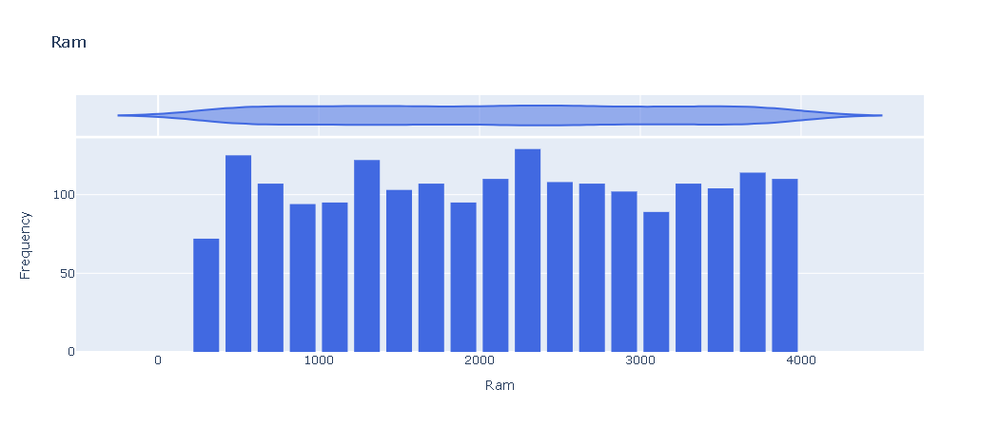

In [ ]:
fig = px.histogram(df,x = 'ram',
                  title = 'Ram',
                   marginal = 'violin',
                  color_discrete_sequence = ['royalblue'])
fig.update_layout(
xaxis_title_text = 'Ram',
yaxis_title_text = 'Frequency',
bargap = 0.2, showlegend = False,
             autosize=False,
             width=700,
             height=450)

iplot(fig)

<span style="color:#337AB7;
             font-size:180%;">
Battery Power

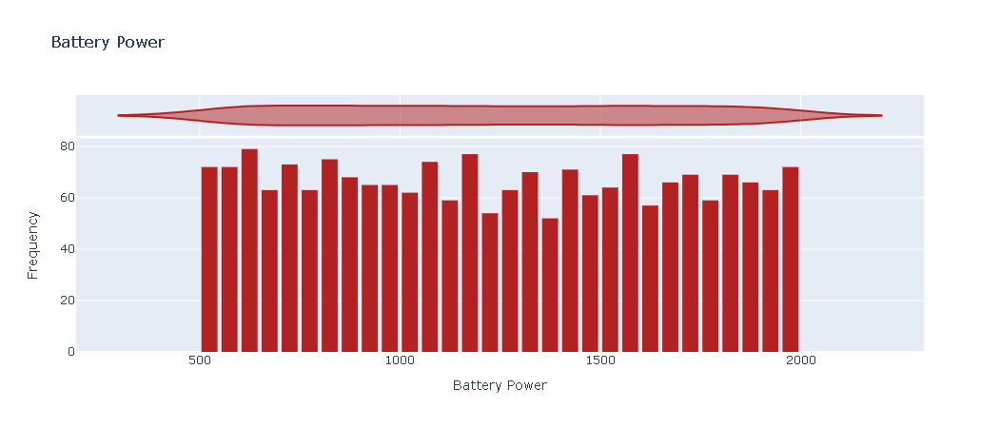

In [ ]:
fig = px.histogram(df,x = 'battery_power',
                  title = 'Battery Power',
                   marginal = 'violin',
                  color_discrete_sequence = ['firebrick'])
fig.update_layout(
xaxis_title_text = 'Battery Power',
yaxis_title_text = 'Frequency',
bargap = 0.2, showlegend = False,
             autosize=False,
             width=700,
             height=450)

iplot(fig)

<span style="color:#337AB7;
             font-size:180%;">
Int Memory

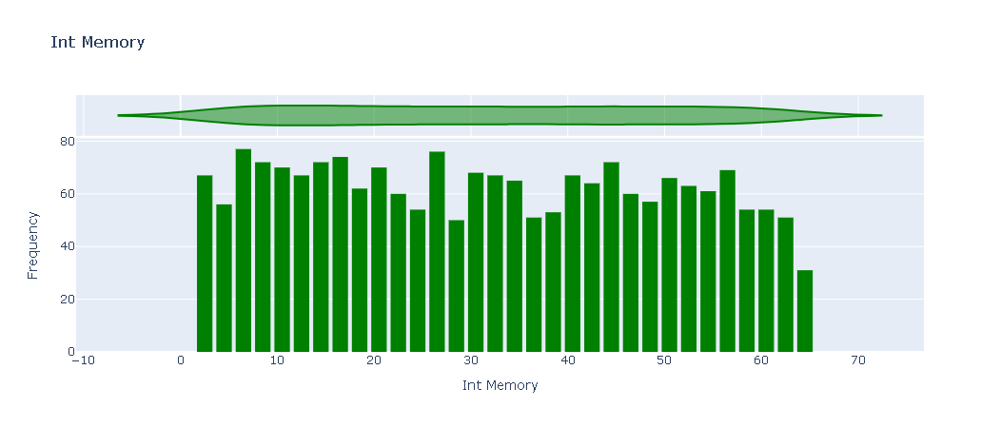

In [ ]:
fig = px.histogram(df,x = 'int_memory',
                  title = 'Int Memory',
                   marginal = 'violin',
                  color_discrete_sequence = ['green'])
fig.update_layout(
xaxis_title_text = 'Int Memory',
yaxis_title_text = 'Frequency',
bargap = 0.2, showlegend = False,
             autosize=False,
             width=700,
             height=450)

iplot(fig)

<a id = "9"></a>
<span style="color:#337AB7;
             font-size:180%;">
Ram - Price Range

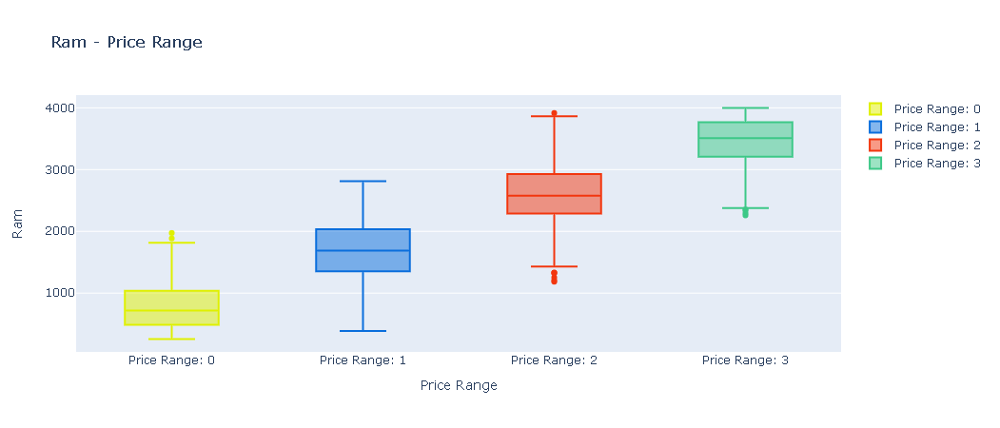

In [ ]:
df_pr_0 = df[df.price_range == 0]
df_pr_1 = df[df.price_range == 1]
df_pr_2 = df[df.price_range == 2]
df_pr_3 = df[df.price_range == 3]

trace0 = go.Box(
    y=df_pr_0.ram,
    name = 'Price Range: 0',
    marker = dict(
        color = 'rgb(223, 240, 0)',
    )
)
trace1 = go.Box(
    y=df_pr_1.ram,
    name = 'Price Range: 1',
    marker = dict(
        color = 'rgb(10, 110, 220)',
    )
)
trace2 = go.Box(
    y=df_pr_2.ram,
    name = 'Price Range: 2',
    marker = dict(
        color = 'rgb(242, 54, 14)',
    )
)
trace3 = go.Box(
    y=df_pr_3.ram,
    name = 'Price Range: 3',
    marker = dict(
        color = 'rgb(60, 200, 135)',
    )
)

data = [trace0, trace1, trace2, trace3]

layout = dict(title = 'Ram - Price Range',
              xaxis= dict(title= 'Price Range',
                          ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Ram',
                          ticklen= 5,zeroline= False),
             autosize=False,
             width=700,
             height=450)

fig = dict(data = data, layout = layout)

iplot(fig)

<a id = "8"></a>
<span style="color:#337AB7;
             font-size:180%;">
Battery Power - Price Range

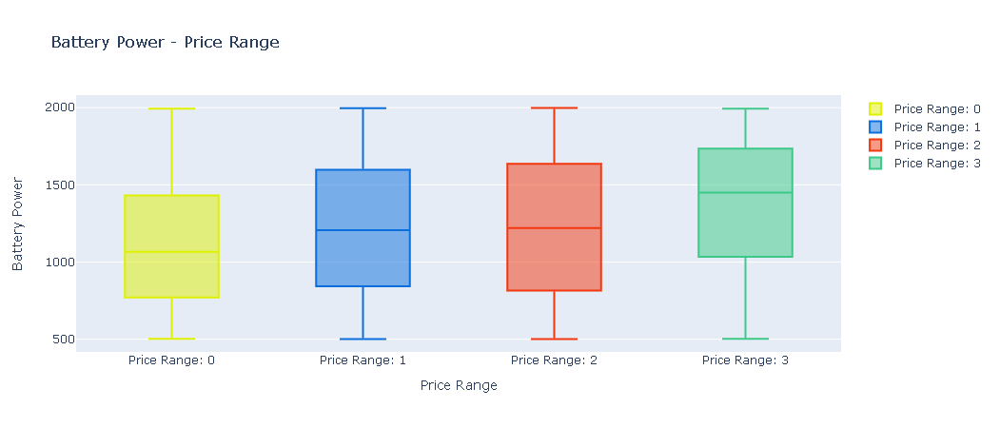

In [ ]:
df_pr_0 = df[df.price_range == 0]
df_pr_1 = df[df.price_range == 1]
df_pr_2 = df[df.price_range == 2]
df_pr_3 = df[df.price_range == 3]

trace0 = go.Box(
    y=df_pr_0.battery_power,
    name = 'Price Range: 0',
    marker = dict(
        color = 'rgb(223, 240, 0)',
    )
)
trace1 = go.Box(
    y=df_pr_1.battery_power,
    name = 'Price Range: 1',
    marker = dict(
        color = 'rgb(10, 110, 220)',
    )
)
trace2 = go.Box(
    y=df_pr_2.battery_power,
    name = 'Price Range: 2',
    marker = dict(
        color = 'rgb(242, 54, 14)',
    )
)
trace3 = go.Box(
    y=df_pr_3.battery_power,
    name = 'Price Range: 3',
    marker = dict(
        color = 'rgb(60, 200, 135)',
    )
)

data = [trace0, trace1, trace2, trace3]

layout = dict(title = 'Battery Power - Price Range',
              xaxis= dict(title= 'Price Range',
                          ticklen= 5,zeroline= False),
              yaxis= dict(title= 'Battery Power',
                          ticklen= 5,zeroline= False),
             autosize=False,
             width=700,
             height=450)

fig = dict(data = data, layout = layout)

iplot(fig)

<a id = "6"></a>
<span style="color:#337AB7;
             font-size:180%;">
Phone Height - Price Range

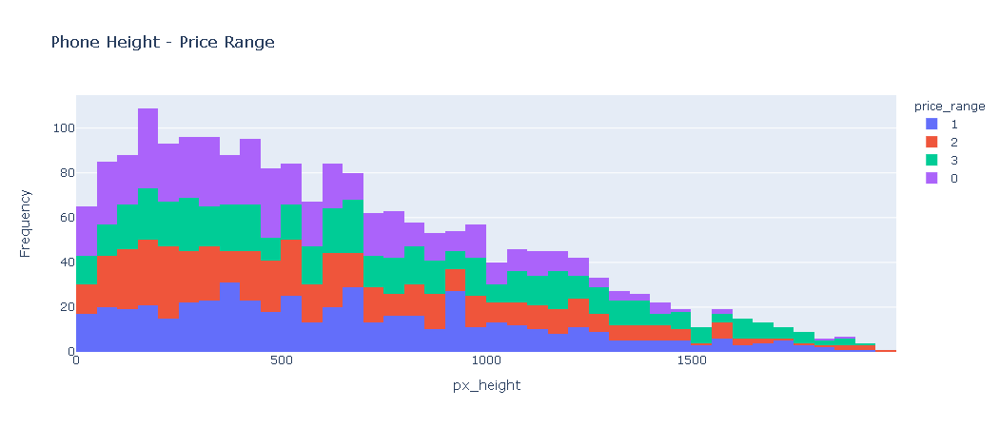

In [ ]:
fig = px.histogram(df, x = 'px_height',
                   color = 'price_range',
                   title = "Phone Height - Price Range")
fig.update_layout(
xaxis_title_text = 'px_height',
yaxis_title_text = 'Frequency',autosize=False,
    width=700,
    height=450)
fig

<a id = "7"></a>
<span style="color:#337AB7;
             font-size:180%;">
Phone Width - Price Range

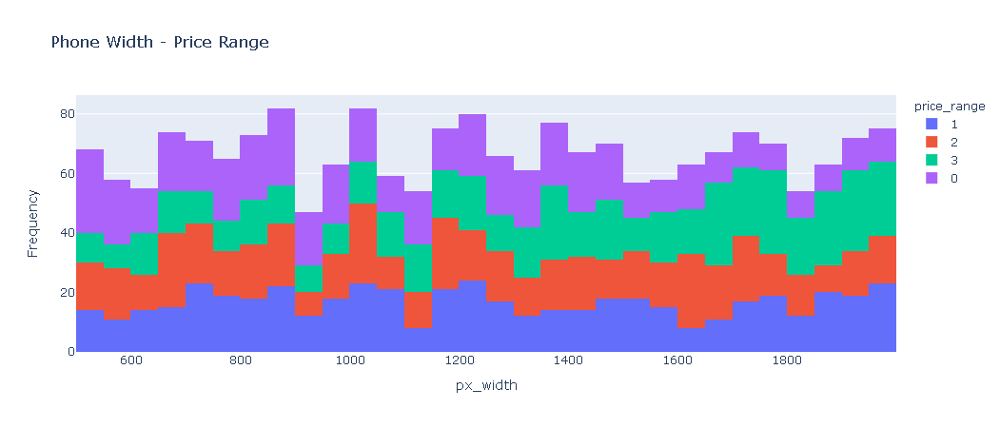

In [ ]:
fig = px.histogram(df, x = 'px_width',
                   color = 'price_range',
                   title = "Phone Width - Price Range")
fig.update_layout(
xaxis_title_text = 'px_width',
yaxis_title_text = 'Frequency',autosize=False,
    width=700,
    height=450)
fig

<a id = "11"></a>
<span style="color:#337AB7;
             font-size:180%;">
Correlation Map

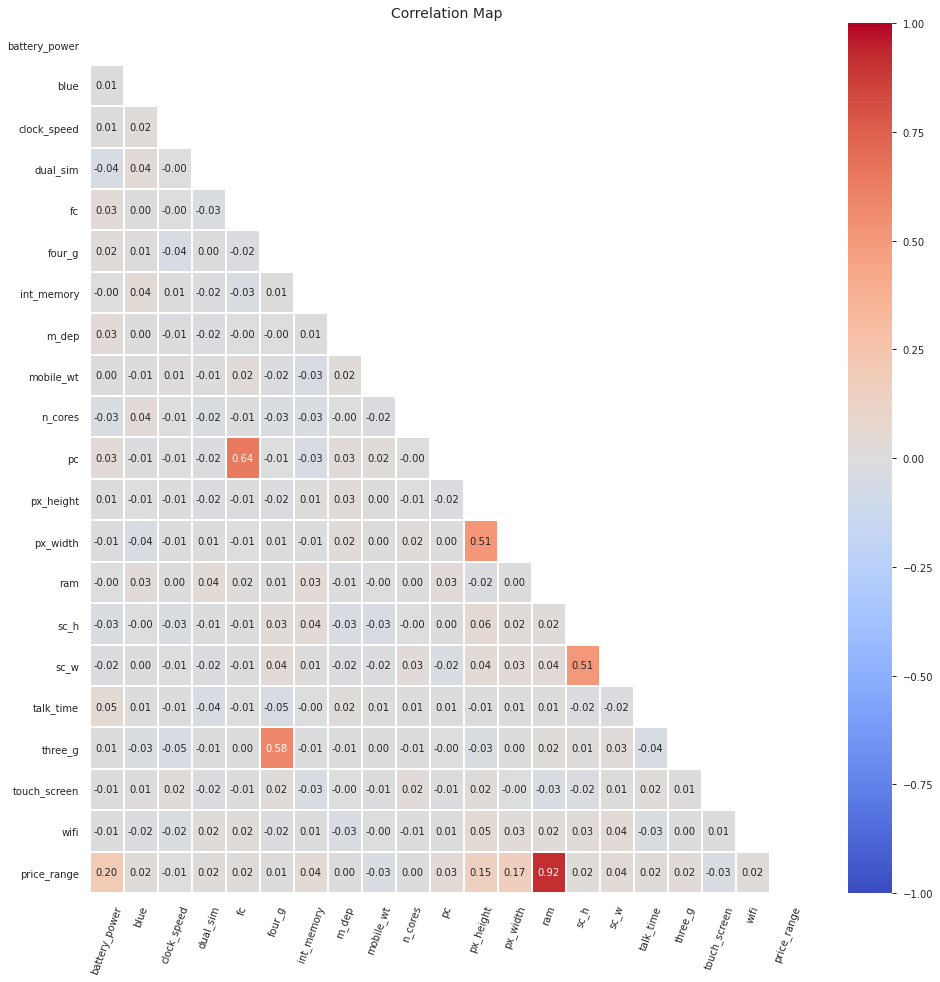

In [ ]:
matrix = np.triu(df.corr())
sns.set_style("white")
f,ax=plt.subplots(figsize = (16,16))
sns.heatmap(df.corr(),annot= True,fmt = ".2f",ax=ax,
            vmin = -1,
            vmax = 1, mask = matrix,cmap = "coolwarm",
            linewidth = 0.2,linecolor = "white")
plt.xticks(rotation=70)
plt.yticks(rotation=0)
plt.title('Correlation Map', size = 14)
plt.show()

<a id = "12"></a>
<span style="color:#337AB7;
             font-size:180%;">
Thresholded Correlation Map

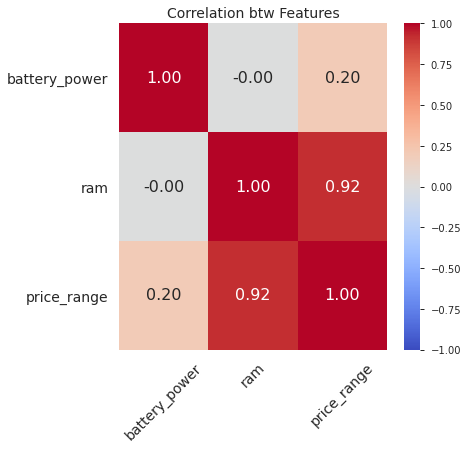

In [ ]:
corr_matrix = df.corr()

threshold = 0.20
filter = np.abs(corr_matrix["price_range"])>threshold
corr_features = corr_matrix.columns[filter].tolist()

f,ax=plt.subplots(figsize = (6,6))
sns.heatmap(df[corr_features].corr(),annot= True,fmt = ".2f",
            vmin = -1,vmax = 1,ax=ax,annot_kws={"size": 16},cmap = "coolwarm")
plt.xticks(rotation=45, size = 14)
plt.yticks(rotation=0, size = 14)
plt.title('Correlation btw Features', size = 14)
plt.show()

<a id = "13"></a>
<span style="color:#337AB7;
             font-size:200%;">
Preprocessing
    
<a id = "14"></a>
<span style="color:#337AB7;
             font-size:180%;">
Train Test Split

In [ ]:
random_state = 42

X = df.iloc[:,0:20].values
y = df.iloc[:, 20].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = random_state)

<a id = "15"></a>
<span style="color:#337AB7;
             font-size:180%;">
Standardization

In [ ]:
sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

<a id = "16"></a>
<span style="color:#337AB7;
             font-size:200%;">
Models
    
<a id = "17"></a>
<span style="color:#337AB7;
             font-size:180%;">
Logistic Regression

In [ ]:
classifier = LogisticRegression(random_state = random_state)

classifier.fit(X_train,y_train)

y_pred = classifier.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       105
           1       0.94      1.00      0.97        91
           2       0.99      0.95      0.97        92
           3       0.97      0.99      0.98       112

    accuracy                           0.97       400
   macro avg       0.98      0.97      0.97       400
weighted avg       0.98      0.97      0.98       400



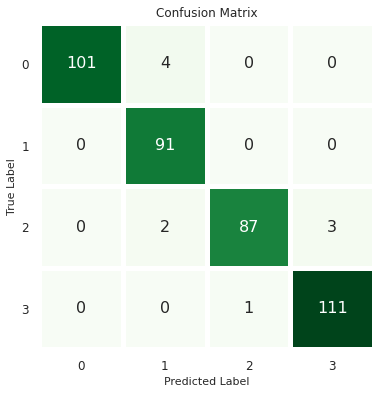

In [ ]:
cm = confusion_matrix(y_test, y_pred)

df1 = pd.DataFrame(columns=["0","1","2","3"], index= ["0","1","2","3"], data= cm )

f,ax = plt.subplots(figsize=(6,6))

sns.heatmap(df1, annot=True,cmap="Greens", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,annot_kws={"size": 16})
plt.xlabel("Predicted Label")
plt.xticks(size = 12)
plt.yticks(size = 12, rotation = 0)
plt.ylabel("True Label")
plt.title("Confusion Matrix", size = 12)
plt.show()

<a id = "18"></a>
<span style="color:#337AB7;
             font-size:180%;">
Linear Discriminant Analysis

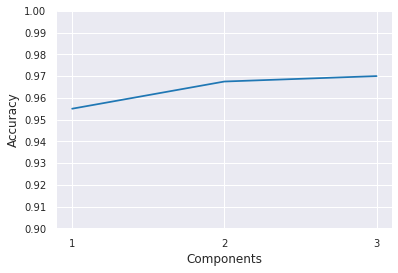

In [ ]:
sns.set_style("darkgrid")
accuracy = []
for i in range(1,4):
    lda = LDA(n_components = i)

    X_train_lda = lda.fit_transform(X_train,y_train)
    X_test_lda = lda.transform(X_test)

    classifier_lda = LogisticRegression()
    classifier_lda.fit(X_train_lda, y_train)

    y_pred_lda = classifier_lda.predict(X_test_lda)

    accuracy.append(accuracy_score(y_test, y_pred_lda))

plt.figure(figsize = (6,4))
plt.plot([1,2,3], accuracy)
plt.xticks([1,2,3])
plt.yticks([0.90,0.91,0.92,0.93,0.94,0.95,
            0.96,0.97,0.98,0.99,1])
plt.xlabel("Components", size = 12)
plt.ylabel("Accuracy", size = 12)
plt.show()

In [ ]:
lda = LDA(n_components = 3)

X_train_lda = lda.fit_transform(X_train,y_train)
X_test_lda = lda.transform(X_test)

classifier_lda = LogisticRegression(random_state = random_state)
classifier_lda.fit(X_train_lda, y_train)

y_pred_lda = classifier_lda.predict(X_test_lda)

print(classification_report(y_test, y_pred_lda))

              precision    recall  f1-score   support

           0       1.00      0.97      0.99       105
           1       0.97      0.99      0.98        91
           2       0.94      0.97      0.95        92
           3       0.97      0.96      0.96       112

    accuracy                           0.97       400
   macro avg       0.97      0.97      0.97       400
weighted avg       0.97      0.97      0.97       400



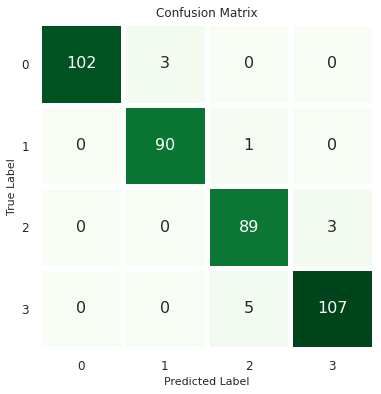

In [ ]:
cm = confusion_matrix(y_test, y_pred_lda)

df1 = pd.DataFrame(columns=["0","1","2","3"], index= ["0","1","2","3"], data= cm )

f,ax = plt.subplots(figsize=(6,6))

sns.heatmap(df1, annot=True,cmap="Greens", fmt= '.0f',ax=ax,
            linewidths = 5, cbar = False,annot_kws={"size": 16})
plt.xlabel("Predicted Label")
plt.xticks(size = 12)
plt.yticks(size = 12, rotation = 0)
plt.ylabel("True Label")
plt.title("Confusion Matrix", size = 12)
plt.show()

<a id = "19"></a>
<span style="color:#337AB7;
             font-size:180%;">
Hyperparameter Tuning - Grid Search - Cross Validation
    
We will compare 8 classifier and evaluate mean accuracy of each of them by stratified cross validation.

- Decision Tree Classifier
- SVC
- Random Forest Classifier
- Logistic Regression
- KNN Classifier
- Stochastic Gradient Descent Classifier
- Gradient Boosting Classifier
- LightGBM Classifier

---------------------------------------------------------------------------
Fitting 10 folds for each of 250 candidates, totalling 2500 fits
Model: DecisionTreeClassifier(random_state=42)
Accuracy: %84.06
MSE: 0.175
ROC AUC: 0.911858935204842
Recall: 0.825
Precision: 0.8276565656565658
F1-Score: 0.8257884190113292
Best Estimator: DecisionTreeClassifier(max_depth=11, min_samples_split=10, random_state=42)
---------------------------------------------------------------------------
Fitting 10 folds for each of 32 candidates, totalling 320 fits
Model: SVC(probability=True, random_state=42)
Accuracy: %94.81
MSE: 0.0425
ROC AUC: 0.9987539406510985
Recall: 0.9575
Precision: 0.9583036987522283
F1-Score: 0.9576732678970531
Best Estimator: SVC(C=1000, gamma=0.001, probability=True, random_state=42)
---------------------------------------------------------------------------
Fitting 10 folds for each of 54 candidates, totalling 540 fits
Model: RandomForestClassifier(random_state=42)
Accuracy: %89.

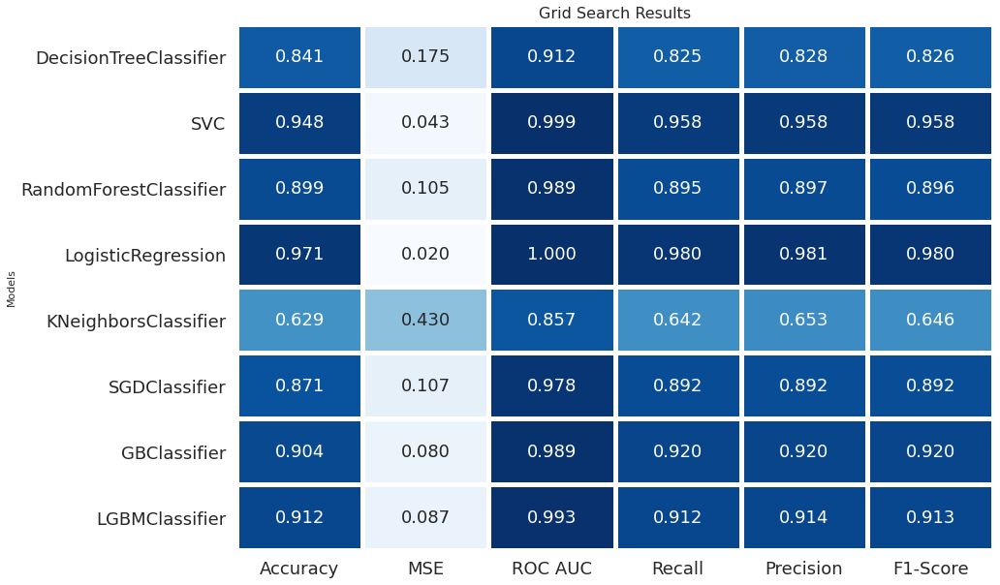

In [ ]:
classifier = [DecisionTreeClassifier(random_state = random_state),
             SVC(random_state = random_state, probability = True),
             RandomForestClassifier(random_state = random_state),
             LogisticRegression(random_state = random_state),
             KNeighborsClassifier(),
             SGDClassifier(random_state = random_state),
             GradientBoostingClassifier(random_state = random_state),
             LGBMClassifier(random_state = random_state)]

dt_param_grid = {"min_samples_split" : range(10,500,20),
                "max_depth": range(1,20,2)}

svc_param_grid = {"kernel" : ["rbf"],
                 "gamma": [0.001, 0.01, 0.1, 1],
                 "C": [0.1, 1,10,50,100,200,300,1000]}

rf_param_grid = {"max_features": [1,3,10],
                "min_samples_split":[2,3,10],
                "min_samples_leaf":[1,3,10],
                "bootstrap":[False],
                "n_estimators":[100,300],
                "criterion":["gini"]}

logreg_param_grid = {"C":np.logspace(-4, 4, 20),
                    "penalty": ["l1","l2","none"]}

knn_param_grid = {"n_neighbors": np.linspace(2,20,12, dtype = int).tolist(),
                 "weights": ["uniform","distance"],
                 "metric":["euclidean","manhattan","minkowski"],
                 "leaf_size": [1,3,5,12,30]}

sgdc_param_grid = {
    "loss" : ["hinge", "log", "squared_hinge", "modified_huber"],
    "alpha" : [0.0001, 0.001, 0.01, 0.1],
    "penalty" : ["l2", "l1", "none"]}

gbc_param_grid = {
    "learning_rate": [0.05, 0.1, 0.2],
    "min_samples_split": [2,3,10],
    "min_samples_leaf": [1,3,10]
    }


lgbmc_param_grid = {
    'num_leaves': [31, 127],
    'reg_alpha': [0.1, 0.5],
    'min_data_in_leaf': [30, 50, 100, 300],
    'lambda_l1': [0, 1, 1.5],
    'lambda_l2': [0, 1]}


classifier_param = [dt_param_grid,
                   svc_param_grid,
                   rf_param_grid,
                   logreg_param_grid,
                   knn_param_grid,
                   sgdc_param_grid,
                   gbc_param_grid,
                   lgbmc_param_grid]

cv_result = []
best_estimators = []
mean_squared_errors = []
roc_auc_scores = []
recall_scores = []
precision_scores = []
f1_scores = []


for i in range(len(classifier)):
    print("---------------------------------------------------------------------------")
    clf = GridSearchCV(classifier[i],
                       param_grid=classifier_param[i],
                       cv = StratifiedKFold(n_splits = 10),
                       scoring = "accuracy",
                       n_jobs = -1,verbose = 2)

    clf.fit(X_train,y_train)

    cv_result.append(clf.best_score_)

    mean_squared_errors.append(mean_squared_error(y_test,clf.predict(X_test)))

    roc_auc_scores.append(roc_auc_score(y_test, clf.predict_proba(X_test), multi_class='ovr'))

    recall_scores.append(recall_score(y_test, clf.predict(X_test), average='weighted'))

    precision_scores.append(precision_score(y_test, clf.predict(X_test), average='weighted'))

    f1_scores.append(f1_score(y_test, clf.predict(X_test), average='weighted'))

    best_estimators.append(clf.best_estimator_)

    print("Model: {}".format(classifier[i]))
    print("Accuracy: %{}".format(round(cv_result[i]*100,2)))
    print("MSE: {}".format(mean_squared_errors[i]))
    print("ROC AUC: {}".format(roc_auc_scores[i]))
    print("Recall: {}".format(recall_scores[i]))
    print("Precision: {}".format(precision_scores[i]))
    print("F1-Score: {}".format(f1_scores[i]))
    print("Best Estimator: {}".format(clf.best_estimator_))

print("---------------------------------------------------------------------------")

sns.set_style("darkgrid")
cv_results = pd.DataFrame({"Accuracy":cv_result,
                           "MSE":mean_squared_errors,
                           "ROC AUC":roc_auc_scores,
                           "Recall": recall_scores,
                           "Precision": precision_scores,
                           "F1-Score":f1_scores,
                           "Models":["DecisionTreeClassifier",
                                     "SVC",
                                     "RandomForestClassifier",
                                     "LogisticRegression",
                                     "KNeighborsClassifier",
                                     "SGDClassifier",
                                     "GBClassifier",
                                     "LGBMClassifier"]})

cv_results.index = cv_results["Models"]

cv_results  = cv_results.drop(["Models"], axis = 1)

f,ax = plt.subplots(figsize=(14,10))

sns.heatmap(cv_results, annot=True,cmap = "Blues",fmt= '.3f',
            ax=ax,linewidths = 5, cbar = False,
            annot_kws={"size": 18})

plt.xticks(size = 18)
plt.yticks(size = 18, rotation = 0)
plt.ylabel("Models")
plt.title("Grid Search Results", size = 16)
plt.show()

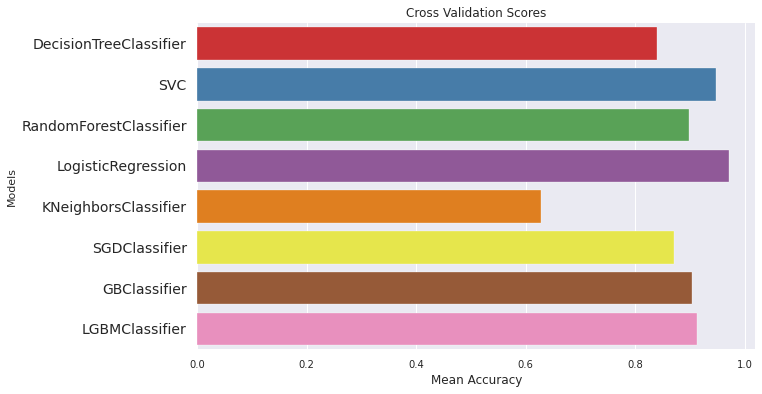

In [ ]:
sns.set_style("darkgrid")
cv_results = pd.DataFrame({"Cross Validation Means":cv_result,
                           "Models":["DecisionTreeClassifier", "SVC",
                                     "RandomForestClassifier",
                                     "LogisticRegression",
                                     "KNeighborsClassifier",
                                     "SGDClassifier",
                                     "GBClassifier",
                                     "LGBMClassifier"]})

plt.figure(figsize = (10,6))
sns.barplot("Cross Validation Means", "Models",
            data = cv_results, palette = "Set1")
plt.xlabel("Mean Accuracy",
           size = 12)
plt.yticks(size = 14)
plt.title("Cross Validation Scores",
          size = 12)
plt.show()

<a id = "20"></a>
<span style="color:#337AB7;
             font-size:180%;">
Ensemble Learning

In [ ]:
votingC = VotingClassifier(estimators = [("svc",best_estimators[1]),
                                        ("lr",best_estimators[3]),
                                        ("lgbm",best_estimators[7])])

votingC = votingC.fit(X_train, y_train)

voting_pred = votingC.predict(X_test)

print(classification_report(y_test, voting_pred))

[LightGBM] [Warning] lambda_l1 is set=0, reg_alpha=0.1 will be ignored. Current value: lambda_l1=0
[LightGBM] [Warning] lambda_l2 is set=0, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
              precision    recall  f1-score   support

           0       1.00      0.94      0.97       105
           1       0.93      1.00      0.96        91
           2       0.97      0.97      0.97        92
           3       0.98      0.97      0.98       112

    accuracy                           0.97       400
   macro avg       0.97      0.97      0.97       400
weighted avg       0.97      0.97      0.97       400



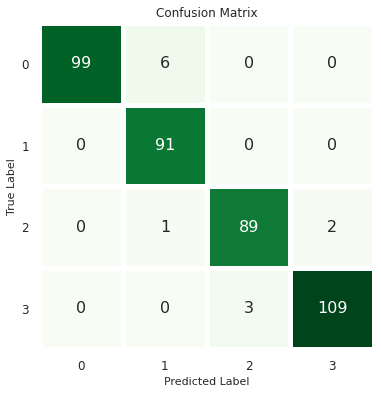

In [ ]:
cm = confusion_matrix(y_test, voting_pred)

df1 = pd.DataFrame(columns=["0","1","2","3"], index= ["0","1","2","3"], data= cm )

f,ax = plt.subplots(figsize=(6,6))

sns.heatmap(df1, annot=True,cmap="Greens", fmt= '.0f',
            ax=ax,linewidths = 5, cbar = False,annot_kws={"size": 16})
plt.xlabel("Predicted Label")
plt.xticks(size = 12)
plt.yticks(size = 12, rotation = 0)
plt.ylabel("True Label")
plt.title("Confusion Matrix", size = 12)
plt.show()

<a id = "21"></a>
<span style="color:#337AB7;
             font-size:180%;">
Best Estimator

In [ ]:
classifier = LogisticRegression(C=545.5594781168514, random_state=42)

classifier.fit(X_train,y_train)

y_pred = classifier.predict(X_test)

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.95      0.98       105
           1       0.95      1.00      0.97        91
           2       0.99      0.98      0.98        92
           3       0.98      0.99      0.99       112

    accuracy                           0.98       400
   macro avg       0.98      0.98      0.98       400
weighted avg       0.98      0.98      0.98       400



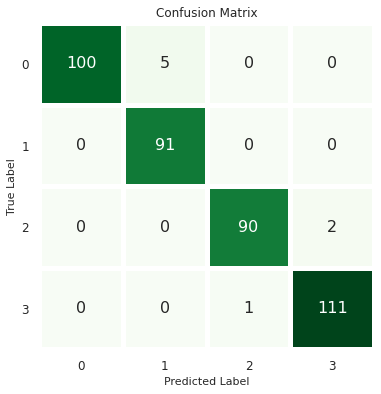

In [ ]:
cm = confusion_matrix(y_test, y_pred)

df1 = pd.DataFrame(columns=["0","1","2","3"], index= ["0","1","2","3"], data= cm )

f,ax = plt.subplots(figsize=(6,6))

sns.heatmap(df1, annot=True,cmap="Greens", fmt= '.0f',ax=ax,
            linewidths = 5, cbar = False,annot_kws={"size": 16})
plt.xlabel("Predicted Label")
plt.xticks(size = 12)
plt.yticks(size = 12, rotation = 0)
plt.ylabel("True Label")
plt.title("Confusion Matrix", size = 12)
plt.show()

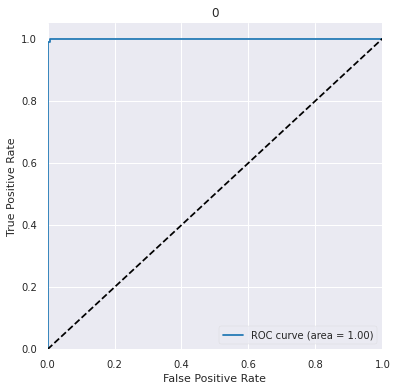

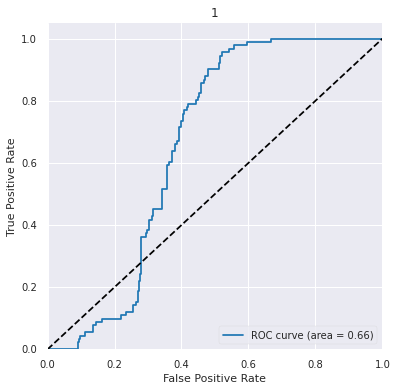

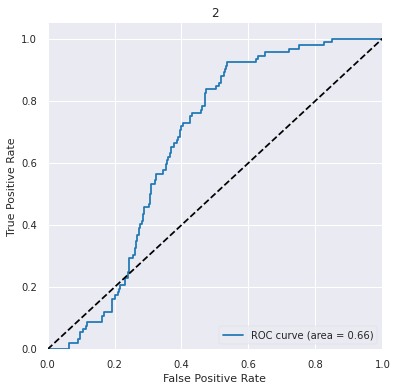

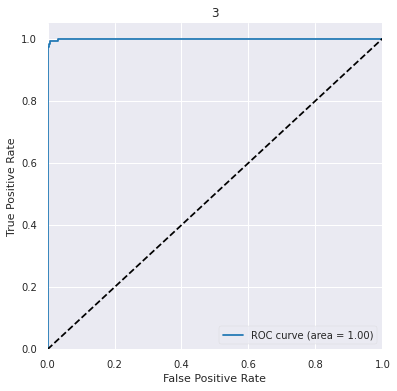

In [ ]:
X = df.iloc[:,0:20].values
y = df.iloc[:, 20].values

y = label_binarize(y, classes=[0,1,2,3])
n_classes = 4

X_train, X_test, y_train, y_test =\
    train_test_split(X, y, test_size=0.2, random_state=42)

sc = StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

clf = OneVsRestClassifier(best_estimators[3])
y_score = clf.fit(X_train, y_train).decision_function(X_test)

fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i],
                                  y_score[:, i])
    roc_auc[i] = auc(fpr[i],
                     tpr[i])

for i in range(n_classes):
    plt.figure(figsize = (6,6))
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(i)
    plt.legend(loc="lower right")
    plt.show()